In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
# Helper libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import tensorflow_datasets as tfds
import os
import PIL
import PIL.Image
import keras

In [ ]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
os.chdir("/content/gdrive/MyDrive/Saved images")
!pwd

/content/gdrive/MyDrive/Saved images


In [ ]:
#unzips the zip file
"""
import zipfile
import os

zip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
zip_ref.close()
"""

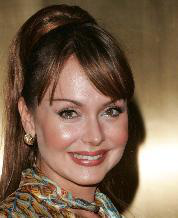

In [ ]:
filePath = "/content/gdrive/MyDrive/celeba"
sampleImage = PIL.Image.open("/tmp/img_align_celeba/000009.jpg")
sampleImage

In [ ]:
dataset = tf.data.Dataset.list_files('/tmp/img_align_celeba/*.jpg', shuffle=True)
image_count = len(os.listdir('/tmp/img_align_celeba/'))

scale = 1.0
dataset = dataset.take(int(image_count * scale))
val_size = int(image_count * scale * 0.15)
trainData = dataset.skip(int(val_size))
valData = dataset.take(val_size)
print(tf.data.experimental.cardinality(trainData).numpy())
print(tf.data.experimental.cardinality(valData).numpy())

172210
30389


In [ ]:
def decode_img(file_path):
  img = tf.io.read_file(file_path)
  # convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  img = tf.image.crop_to_bounding_box(img, 20, 0, 178, 178)
  #img = tf.image.rgb_to_grayscale(img)
  img = img / 255
  # resize the image to the desired size
  return tf.image.resize(img, [96, 96])

trainData = trainData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
valData = valData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)

Image shape:  (96, 96, 3)


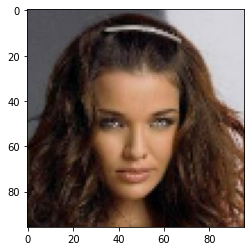

In [ ]:
for image in trainData.take(1):
  plt.imshow(image.numpy())
  #print(image)
  print("Image shape: ", image.numpy().shape)

In [ ]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = '/content/drive/My Drive/projects/faces'
EPOCHS = 50
BATCH_SIZE = 64
BUFFER_SIZE = 60000

In [ ]:
batchSize = BATCH_SIZE
#trainData = trainData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
#valData = valData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
trainData = trainData.batch(batchSize)
valData = valData.batch(batchSize)

In [ ]:
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from keras.constraints import Constraint
from keras import backend

# clip model weights to a given hypercube
class ClipConstraint(Constraint):
	# set clip value when initialized
	def __init__(self, clip_value):
		self.clip_value = clip_value

	# clip model weights to hypercube
	def __call__(self, weights):
		return backend.clip(weights, -self.clip_value, self.clip_value)

	# get the config
	def get_config(self):
		return {'clip_value': self.clip_value}

init = tf.keras.initializers.HeNormal
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size, kernel_initializer = init))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D())
    model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
      model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES)))
      model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))

    #New layer
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("sigmoid"))

    return model


def build_discriminator(image_shape):
    model = Sequential()
    const = ClipConstraint(0.01)

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, padding="same", kernel_constraint=const, kernel_initializer = init))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", kernel_constraint=const, kernel_initializer = init))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", kernel_constraint=const, kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same", kernel_constraint=const, kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same", kernel_constraint=const, kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Flatten())
    model.add(Dense(1, activation='linear', kernel_constraint=const))

    return model

(1, 96, 96, 3)


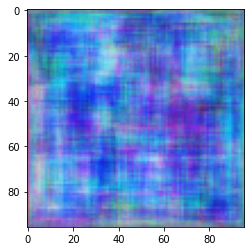

In [ ]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)
#generator = keras.models.load_model("/content/gdrive/MyDrive/generator-v2", compile=False)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

#print(generated_image)
plt.imshow(generated_image[0])
plt.savefig("generatedImage")
print(generated_image.shape)

In [ ]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
#discriminator = keras.models.load_model("/content/gdrive/MyDrive/discriminator-v2", compile=False)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[-0.29098675]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
def wLoss(y_true, y_pred):
	return backend.mean(y_true * y_pred)

def discriminator_loss(real_output, fake_output):
  real_loss = wLoss(tf.ones_like(real_output), real_output)
  fake_loss = wLoss(-tf.ones_like(fake_output), fake_output)
  loss = real_loss + fake_loss
  return loss
  
def generator_loss(fake_output):
    return wLoss(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.RMSprop(0.0001)
discriminator_optimizer = tf.keras.optimizers.RMSprop(0.0001)

In [ ]:
@tf.function
def train_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return gen_loss,disc_loss

def train_step_disc(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=False)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return disc_loss

In [ ]:
@tf.function
def val_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  generated_images = generator(seed, training=False)

  real_output = discriminator(images, training=False)
  fake_output = discriminator(generated_images, training=False)

  return real_output,fake_output

200
tf.Tensor(216.7075, shape=(), dtype=float32) tf.Tensor(-564.59174, shape=(), dtype=float32)


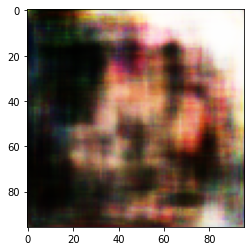

400
tf.Tensor(320.64603, shape=(), dtype=float32) tf.Tensor(-735.31824, shape=(), dtype=float32)


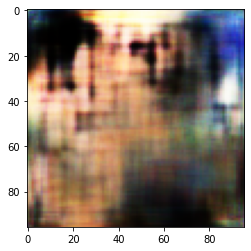

600
tf.Tensor(414.24667, shape=(), dtype=float32) tf.Tensor(-904.2489, shape=(), dtype=float32)


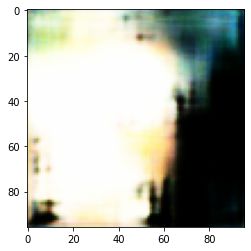

800
tf.Tensor(485.65485, shape=(), dtype=float32) tf.Tensor(-1039.8214, shape=(), dtype=float32)


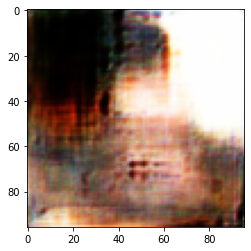

1000
tf.Tensor(527.21136, shape=(), dtype=float32) tf.Tensor(-1122.6964, shape=(), dtype=float32)


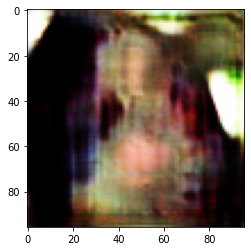

1200
tf.Tensor(566.01135, shape=(), dtype=float32) tf.Tensor(-1204.3424, shape=(), dtype=float32)


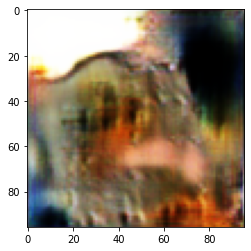

1400
tf.Tensor(606.2097, shape=(), dtype=float32) tf.Tensor(-1286.2216, shape=(), dtype=float32)


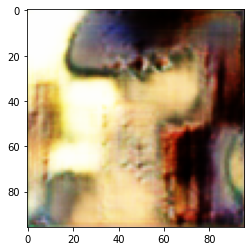

1600
tf.Tensor(653.25415, shape=(), dtype=float32) tf.Tensor(-1368.0798, shape=(), dtype=float32)


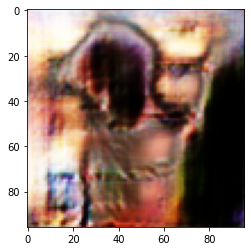

1800
tf.Tensor(695.0047, shape=(), dtype=float32) tf.Tensor(-1450.7103, shape=(), dtype=float32)


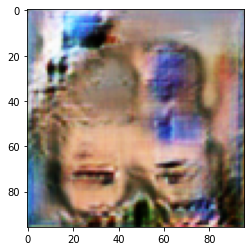

2000
tf.Tensor(732.4852, shape=(), dtype=float32) tf.Tensor(-1531.4067, shape=(), dtype=float32)


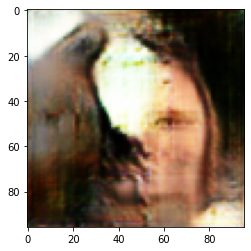

2200
tf.Tensor(773.03503, shape=(), dtype=float32) tf.Tensor(-1608.4735, shape=(), dtype=float32)


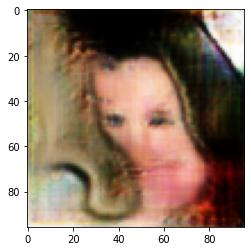

2400
tf.Tensor(809.31647, shape=(), dtype=float32) tf.Tensor(-1672.9973, shape=(), dtype=float32)


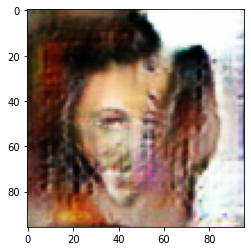

2600
tf.Tensor(834.69366, shape=(), dtype=float32) tf.Tensor(-1730.8743, shape=(), dtype=float32)


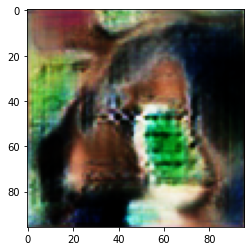

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 1, gen loss=846.5032348632812,disc loss=-1755.893310546875,
Accuracy:  0.01979334627661325
Accuracy on fake:  3.2906643851393593e-05
200
tf.Tensor(1206.2008, shape=(), dtype=float32) tf.Tensor(-2483.4111, shape=(), dtype=float32)


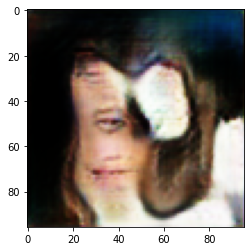

400
tf.Tensor(1239.2384, shape=(), dtype=float32) tf.Tensor(-2559.426, shape=(), dtype=float32)


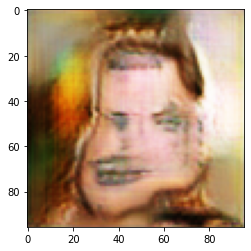

600
tf.Tensor(1268.9034, shape=(), dtype=float32) tf.Tensor(-2615.84, shape=(), dtype=float32)


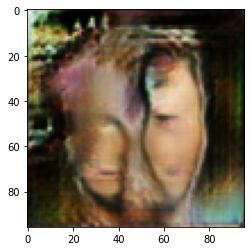

800
tf.Tensor(1295.1123, shape=(), dtype=float32) tf.Tensor(-2656.4526, shape=(), dtype=float32)


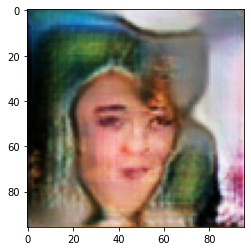

1000
tf.Tensor(1319.4923, shape=(), dtype=float32) tf.Tensor(-2686.398, shape=(), dtype=float32)


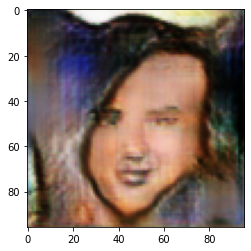

1200
tf.Tensor(1329.2443, shape=(), dtype=float32) tf.Tensor(-2716.0417, shape=(), dtype=float32)


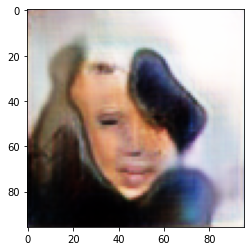

1400
tf.Tensor(1352.9124, shape=(), dtype=float32) tf.Tensor(-2740.0757, shape=(), dtype=float32)


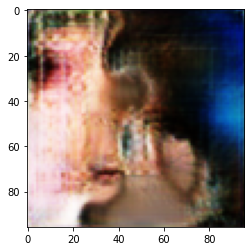

1600
tf.Tensor(1382.8395, shape=(), dtype=float32) tf.Tensor(-2776.2004, shape=(), dtype=float32)


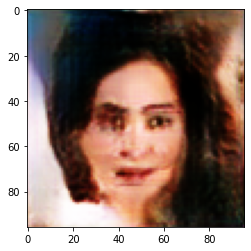

1800
tf.Tensor(1414.7251, shape=(), dtype=float32) tf.Tensor(-2805.0398, shape=(), dtype=float32)


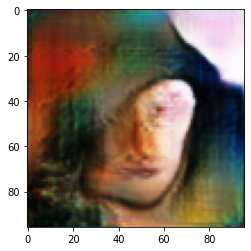

2000
tf.Tensor(1448.6195, shape=(), dtype=float32) tf.Tensor(-2845.5217, shape=(), dtype=float32)


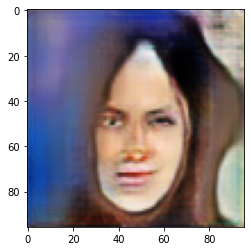

2200
tf.Tensor(1465.4484, shape=(), dtype=float32) tf.Tensor(-2881.4744, shape=(), dtype=float32)


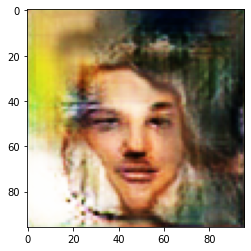

2400
tf.Tensor(1484.8464, shape=(), dtype=float32) tf.Tensor(-2911.8306, shape=(), dtype=float32)


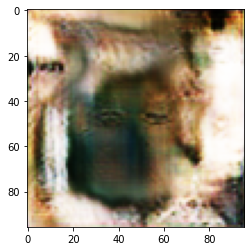

2600
tf.Tensor(1500.7388, shape=(), dtype=float32) tf.Tensor(-2940.4473, shape=(), dtype=float32)


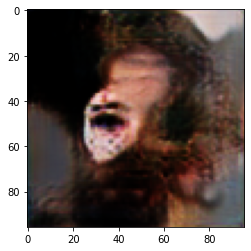

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 2, gen loss=1508.207275390625,disc loss=-2952.1142578125,
Accuracy:  0.024433183059659747
Accuracy on fake:  0.005166343084668795
200
tf.Tensor(1792.8768, shape=(), dtype=float32) tf.Tensor(-3408.2354, shape=(), dtype=float32)


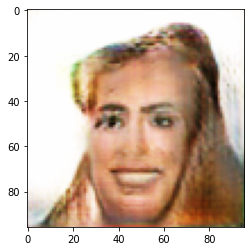

400
tf.Tensor(1832.7485, shape=(), dtype=float32) tf.Tensor(-3447.0107, shape=(), dtype=float32)


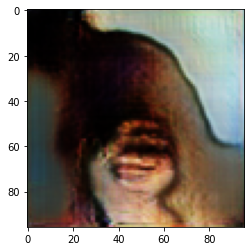

600
tf.Tensor(1841.36, shape=(), dtype=float32) tf.Tensor(-3491.4182, shape=(), dtype=float32)


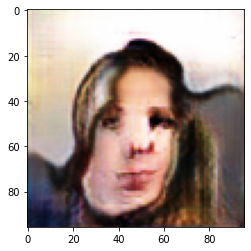

800
tf.Tensor(1863.4856, shape=(), dtype=float32) tf.Tensor(-3508.5212, shape=(), dtype=float32)


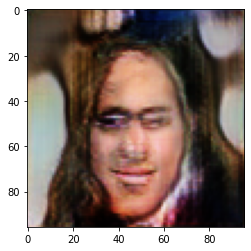

1000
tf.Tensor(1877.0474, shape=(), dtype=float32) tf.Tensor(-3517.7395, shape=(), dtype=float32)


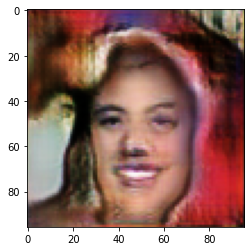

1200
tf.Tensor(1896.3853, shape=(), dtype=float32) tf.Tensor(-3566.185, shape=(), dtype=float32)


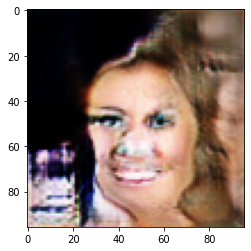

1400
tf.Tensor(1908.0386, shape=(), dtype=float32) tf.Tensor(-3604.6394, shape=(), dtype=float32)


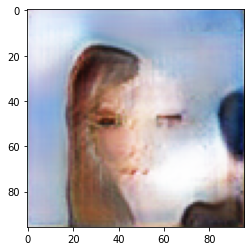

1600
tf.Tensor(1924.2404, shape=(), dtype=float32) tf.Tensor(-3659.4456, shape=(), dtype=float32)


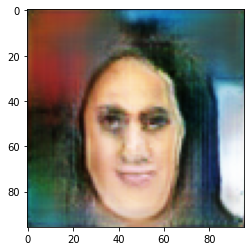

1800
tf.Tensor(1943.1987, shape=(), dtype=float32) tf.Tensor(-3715.5425, shape=(), dtype=float32)


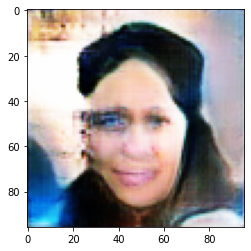

2000
tf.Tensor(1949.6409, shape=(), dtype=float32) tf.Tensor(-3741.5437, shape=(), dtype=float32)


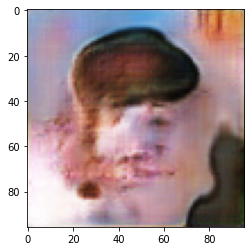

2200
tf.Tensor(1977.1223, shape=(), dtype=float32) tf.Tensor(-3773.092, shape=(), dtype=float32)


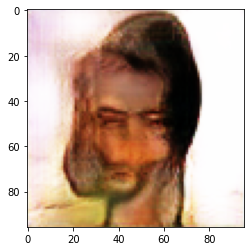

2400
tf.Tensor(1995.9858, shape=(), dtype=float32) tf.Tensor(-3808.053, shape=(), dtype=float32)


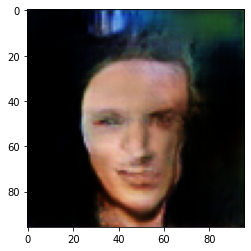

2600
tf.Tensor(2033.1046, shape=(), dtype=float32) tf.Tensor(-3842.0823, shape=(), dtype=float32)


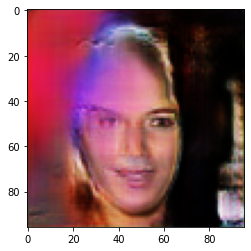

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 3, gen loss=2031.8494873046875,disc loss=-3856.871337890625,
Accuracy:  0.2605054460495574
Accuracy on fake:  0.0060548224686564215
200
tf.Tensor(2300.6912, shape=(), dtype=float32) tf.Tensor(-4262.628, shape=(), dtype=float32)


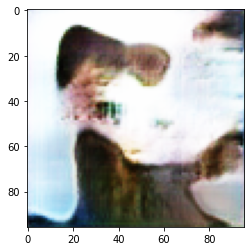

400
tf.Tensor(2308.4348, shape=(), dtype=float32) tf.Tensor(-4260.009, shape=(), dtype=float32)


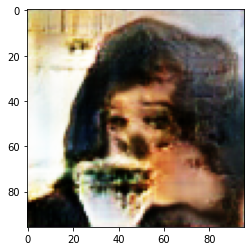

600
tf.Tensor(2324.119, shape=(), dtype=float32) tf.Tensor(-4270.375, shape=(), dtype=float32)


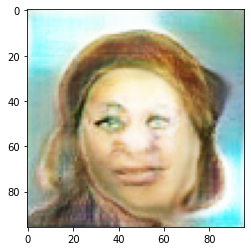

800
tf.Tensor(2306.8484, shape=(), dtype=float32) tf.Tensor(-4294.4595, shape=(), dtype=float32)


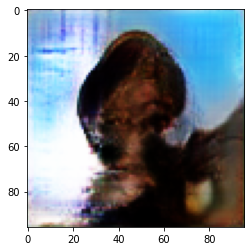

1000
tf.Tensor(2293.0828, shape=(), dtype=float32) tf.Tensor(-4299.9614, shape=(), dtype=float32)


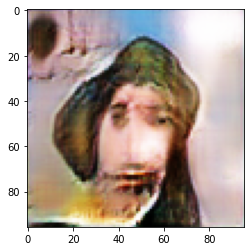

1200
tf.Tensor(2294.7947, shape=(), dtype=float32) tf.Tensor(-4327.2207, shape=(), dtype=float32)


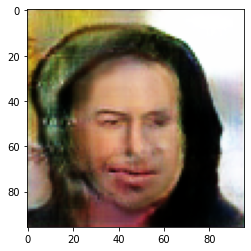

1400
tf.Tensor(2325.2063, shape=(), dtype=float32) tf.Tensor(-4355.637, shape=(), dtype=float32)


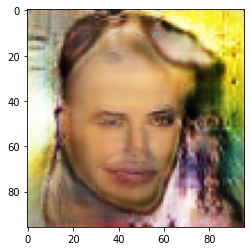

1600
tf.Tensor(2330.4424, shape=(), dtype=float32) tf.Tensor(-4391.312, shape=(), dtype=float32)


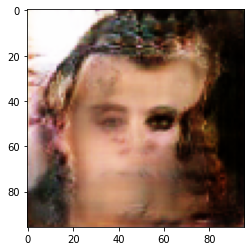

1800
tf.Tensor(2359.7695, shape=(), dtype=float32) tf.Tensor(-4443.065, shape=(), dtype=float32)


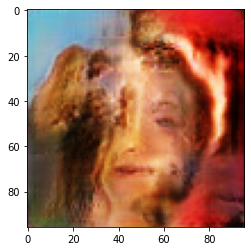

2000
tf.Tensor(2374.199, shape=(), dtype=float32) tf.Tensor(-4430.7964, shape=(), dtype=float32)


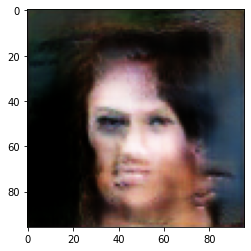

2200
tf.Tensor(2383.5955, shape=(), dtype=float32) tf.Tensor(-4434.6147, shape=(), dtype=float32)


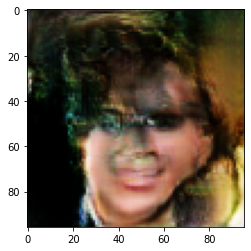

2400
tf.Tensor(2398.7983, shape=(), dtype=float32) tf.Tensor(-4444.039, shape=(), dtype=float32)


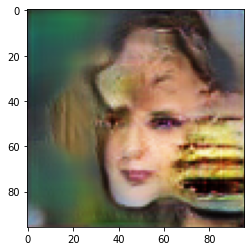

2600
tf.Tensor(2419.3652, shape=(), dtype=float32) tf.Tensor(-4460.9385, shape=(), dtype=float32)


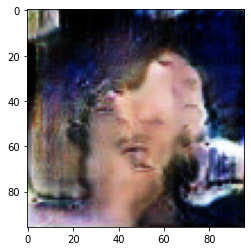

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 4, gen loss=2429.3076171875,disc loss=-4462.31396484375,
Accuracy:  0.4752377505018263
Accuracy on fake:  0.000164533219256968
200
tf.Tensor(2797.3103, shape=(), dtype=float32) tf.Tensor(-4823.4883, shape=(), dtype=float32)


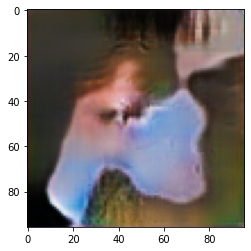

400
tf.Tensor(2671.3022, shape=(), dtype=float32) tf.Tensor(-4761.8506, shape=(), dtype=float32)


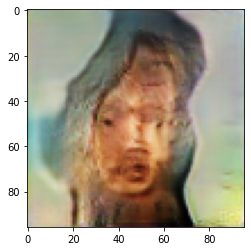

600
tf.Tensor(2620.4756, shape=(), dtype=float32) tf.Tensor(-4775.5317, shape=(), dtype=float32)


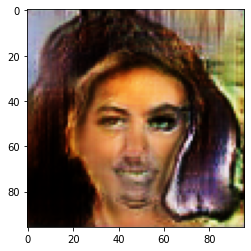

800
tf.Tensor(2520.8015, shape=(), dtype=float32) tf.Tensor(-4766.5366, shape=(), dtype=float32)


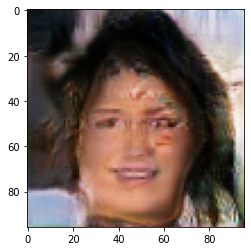

1000
tf.Tensor(2556.423, shape=(), dtype=float32) tf.Tensor(-4716.121, shape=(), dtype=float32)


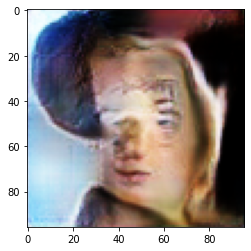

1200
tf.Tensor(2567.2734, shape=(), dtype=float32) tf.Tensor(-4742.17, shape=(), dtype=float32)


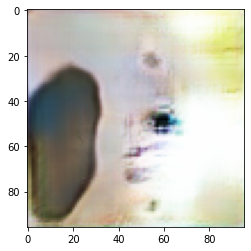

1400
tf.Tensor(2576.8606, shape=(), dtype=float32) tf.Tensor(-4756.0684, shape=(), dtype=float32)


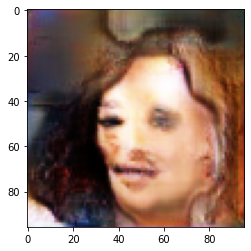

1600
tf.Tensor(2593.439, shape=(), dtype=float32) tf.Tensor(-4734.768, shape=(), dtype=float32)


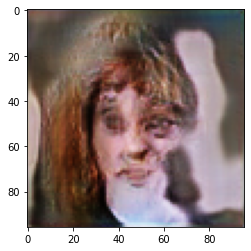

1800
tf.Tensor(2609.8757, shape=(), dtype=float32) tf.Tensor(-4749.292, shape=(), dtype=float32)


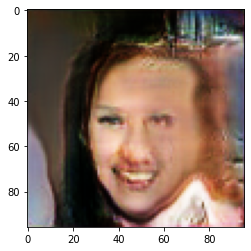

2000
tf.Tensor(2619.7834, shape=(), dtype=float32) tf.Tensor(-4771.37, shape=(), dtype=float32)


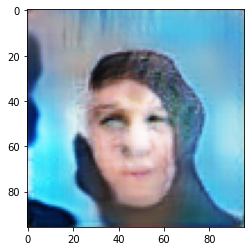

2200
tf.Tensor(2607.5464, shape=(), dtype=float32) tf.Tensor(-4757.7485, shape=(), dtype=float32)


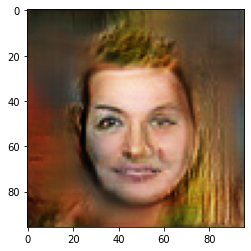

2400
tf.Tensor(2613.3706, shape=(), dtype=float32) tf.Tensor(-4760.836, shape=(), dtype=float32)


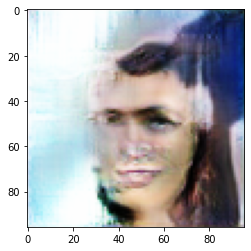

2600
tf.Tensor(2619.3047, shape=(), dtype=float32) tf.Tensor(-4762.512, shape=(), dtype=float32)


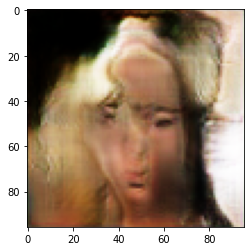

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 5, gen loss=2626.800048828125,disc loss=-4762.935546875,
Accuracy:  0.422998453387739
Accuracy on fake:  0.0005923195893250847
200
tf.Tensor(2689.6084, shape=(), dtype=float32) tf.Tensor(-4610.6807, shape=(), dtype=float32)


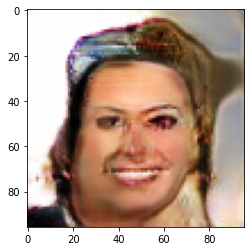

400
tf.Tensor(2784.0947, shape=(), dtype=float32) tf.Tensor(-4725.7637, shape=(), dtype=float32)


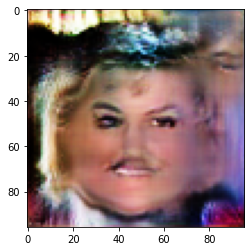

600
tf.Tensor(2707.7393, shape=(), dtype=float32) tf.Tensor(-4703.7866, shape=(), dtype=float32)


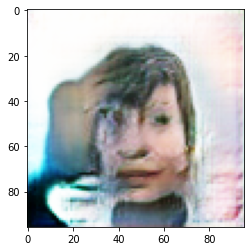

800
tf.Tensor(2721.249, shape=(), dtype=float32) tf.Tensor(-4666.9336, shape=(), dtype=float32)


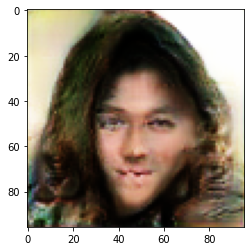

1000
tf.Tensor(2774.7358, shape=(), dtype=float32) tf.Tensor(-4670.614, shape=(), dtype=float32)


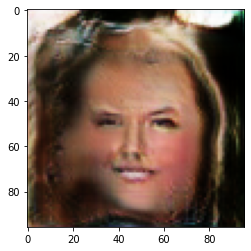

1200
tf.Tensor(2746.9, shape=(), dtype=float32) tf.Tensor(-4533.337, shape=(), dtype=float32)


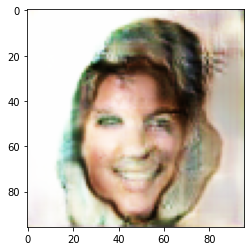

1400
tf.Tensor(2768.6711, shape=(), dtype=float32) tf.Tensor(-4453.048, shape=(), dtype=float32)


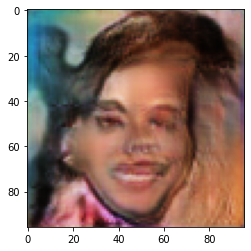

1600
tf.Tensor(2733.695, shape=(), dtype=float32) tf.Tensor(-4388.4414, shape=(), dtype=float32)


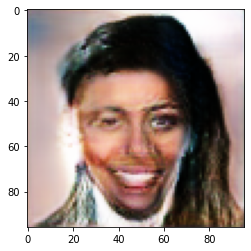

1800
tf.Tensor(2720.7659, shape=(), dtype=float32) tf.Tensor(-4380.0273, shape=(), dtype=float32)


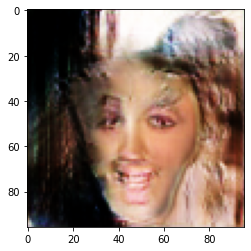

2000
tf.Tensor(2658.2698, shape=(), dtype=float32) tf.Tensor(-4238.91, shape=(), dtype=float32)


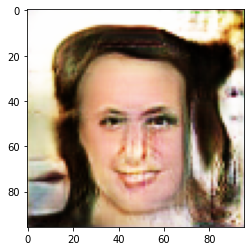

2200
tf.Tensor(2582.44, shape=(), dtype=float32) tf.Tensor(-4110.6396, shape=(), dtype=float32)


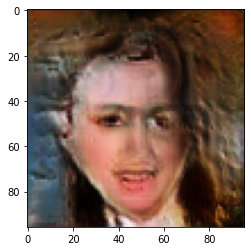

2400
tf.Tensor(2459.4043, shape=(), dtype=float32) tf.Tensor(-3978.4136, shape=(), dtype=float32)


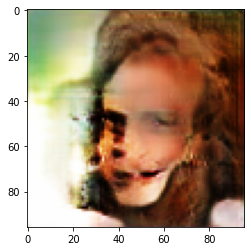

2600
tf.Tensor(2415.5151, shape=(), dtype=float32) tf.Tensor(-3858.5806, shape=(), dtype=float32)


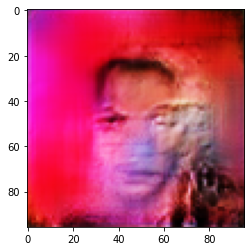

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 6, gen loss=2421.66845703125,disc loss=-3840.472900390625,
Accuracy:  0.46579354371647635
Accuracy on fake:  0.875678699529435
200
tf.Tensor(2400.6233, shape=(), dtype=float32) tf.Tensor(-2564.3057, shape=(), dtype=float32)


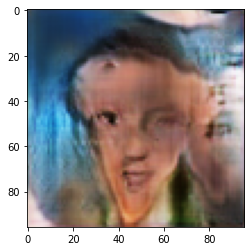

400
tf.Tensor(1844.0061, shape=(), dtype=float32) tf.Tensor(-2532.298, shape=(), dtype=float32)


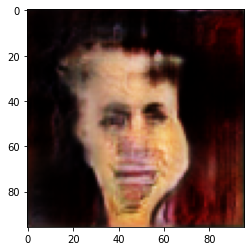

600
tf.Tensor(2071.8499, shape=(), dtype=float32) tf.Tensor(-2780.3574, shape=(), dtype=float32)


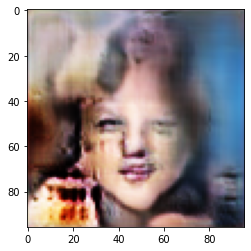

800
tf.Tensor(1935.249, shape=(), dtype=float32) tf.Tensor(-2557.464, shape=(), dtype=float32)


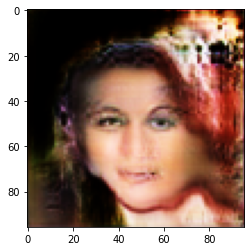

1000
tf.Tensor(1937.2379, shape=(), dtype=float32) tf.Tensor(-2599.2725, shape=(), dtype=float32)


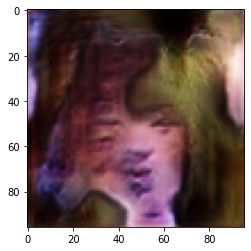

1200
tf.Tensor(1973.5806, shape=(), dtype=float32) tf.Tensor(-2615.246, shape=(), dtype=float32)


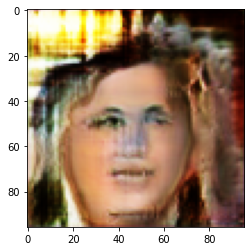

1400
tf.Tensor(2214.6638, shape=(), dtype=float32) tf.Tensor(-2994.27, shape=(), dtype=float32)


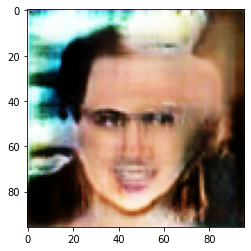

1600
tf.Tensor(2285.7532, shape=(), dtype=float32) tf.Tensor(-2952.865, shape=(), dtype=float32)


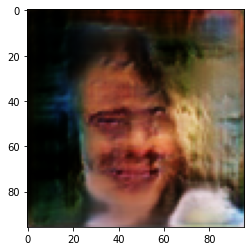

1800
tf.Tensor(2255.6572, shape=(), dtype=float32) tf.Tensor(-2935.6787, shape=(), dtype=float32)


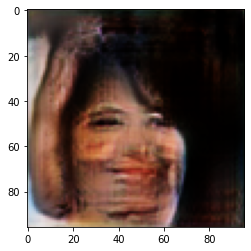

2000
tf.Tensor(2293.0938, shape=(), dtype=float32) tf.Tensor(-2896.4944, shape=(), dtype=float32)


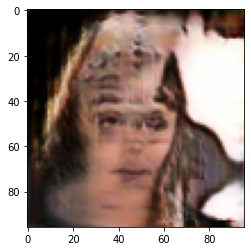

2200
tf.Tensor(2247.037, shape=(), dtype=float32) tf.Tensor(-2883.6106, shape=(), dtype=float32)


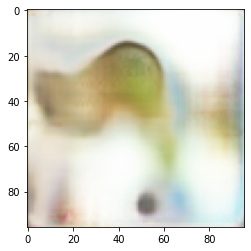

2400
tf.Tensor(2217.8584, shape=(), dtype=float32) tf.Tensor(-2813.217, shape=(), dtype=float32)


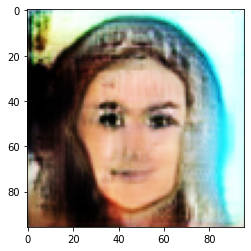

2600
tf.Tensor(2121.419, shape=(), dtype=float32) tf.Tensor(-2753.4536, shape=(), dtype=float32)


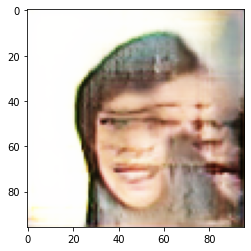

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 7, gen loss=2149.7646484375,disc loss=-2761.263671875,
Accuracy:  0.4988647207871269
Accuracy on fake:  0.0008226660962848399
200
tf.Tensor(1597.1698, shape=(), dtype=float32) tf.Tensor(-2126.0078, shape=(), dtype=float32)


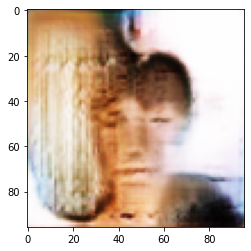

400
tf.Tensor(1989.5696, shape=(), dtype=float32) tf.Tensor(-2418.1843, shape=(), dtype=float32)


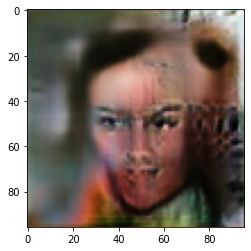

600
tf.Tensor(1802.7615, shape=(), dtype=float32) tf.Tensor(-2271.5476, shape=(), dtype=float32)


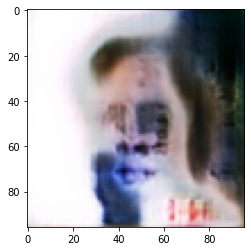

800
tf.Tensor(1815.8689, shape=(), dtype=float32) tf.Tensor(-2450.9197, shape=(), dtype=float32)


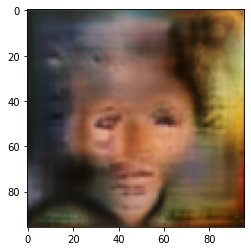

1000
tf.Tensor(1866.2487, shape=(), dtype=float32) tf.Tensor(-2631.746, shape=(), dtype=float32)


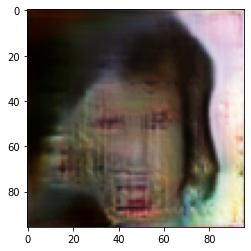

1200
tf.Tensor(1970.2998, shape=(), dtype=float32) tf.Tensor(-2668.6196, shape=(), dtype=float32)


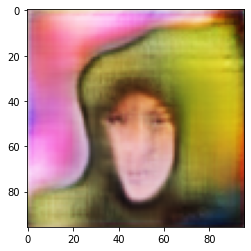

1400
tf.Tensor(1894.94, shape=(), dtype=float32) tf.Tensor(-2606.1724, shape=(), dtype=float32)


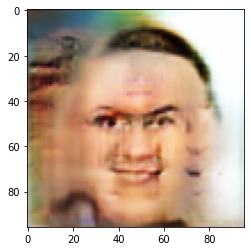

1600
tf.Tensor(2025.6218, shape=(), dtype=float32) tf.Tensor(-2602.185, shape=(), dtype=float32)


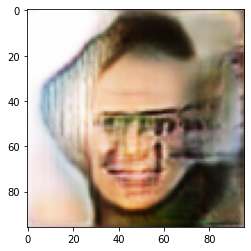

1800
tf.Tensor(2197.0662, shape=(), dtype=float32) tf.Tensor(-2853.4177, shape=(), dtype=float32)


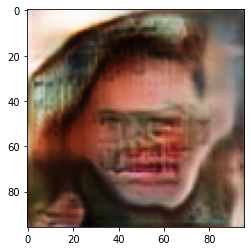

2000
tf.Tensor(2367.8513, shape=(), dtype=float32) tf.Tensor(-2988.364, shape=(), dtype=float32)


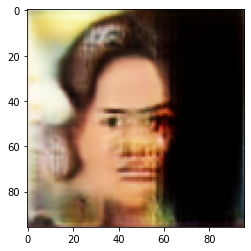

2200
tf.Tensor(2462.5278, shape=(), dtype=float32) tf.Tensor(-3178.1406, shape=(), dtype=float32)


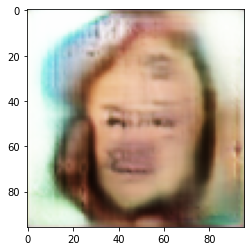

2400
tf.Tensor(2462.8132, shape=(), dtype=float32) tf.Tensor(-3199.6262, shape=(), dtype=float32)


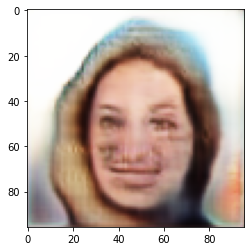

2600
tf.Tensor(2626.408, shape=(), dtype=float32) tf.Tensor(-3562.3064, shape=(), dtype=float32)


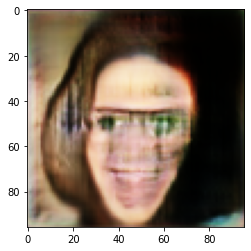

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 8, gen loss=2666.071533203125,disc loss=-3576.4736328125,
Accuracy:  0.4989963473625325
Accuracy on fake:  0.0
200
tf.Tensor(1529.4219, shape=(), dtype=float32) tf.Tensor(-2756.8928, shape=(), dtype=float32)


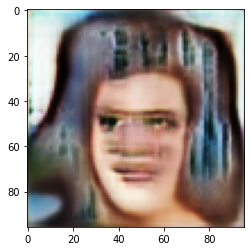

400
tf.Tensor(2584.387, shape=(), dtype=float32) tf.Tensor(-5467.047, shape=(), dtype=float32)


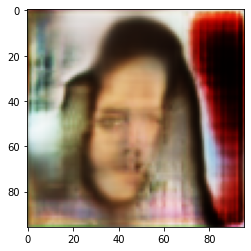

600
tf.Tensor(1813.1954, shape=(), dtype=float32) tf.Tensor(-4352.7334, shape=(), dtype=float32)


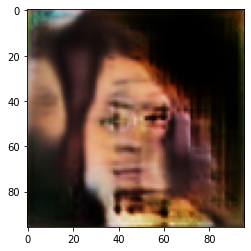

800
tf.Tensor(1468.4342, shape=(), dtype=float32) tf.Tensor(-4027.0767, shape=(), dtype=float32)


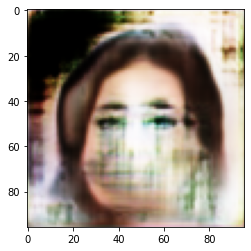

1000
tf.Tensor(1437.469, shape=(), dtype=float32) tf.Tensor(-3887.208, shape=(), dtype=float32)


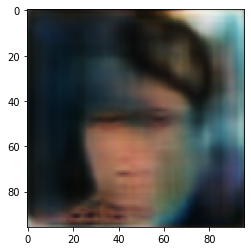

1200
tf.Tensor(1521.7922, shape=(), dtype=float32) tf.Tensor(-3787.2698, shape=(), dtype=float32)


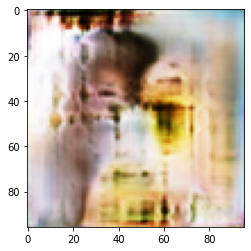

1400
tf.Tensor(1667.5859, shape=(), dtype=float32) tf.Tensor(-3593.1145, shape=(), dtype=float32)


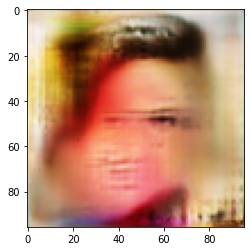

1600
tf.Tensor(1702.4485, shape=(), dtype=float32) tf.Tensor(-3501.2659, shape=(), dtype=float32)


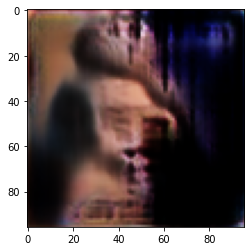

1800
tf.Tensor(1806.2512, shape=(), dtype=float32) tf.Tensor(-3365.7603, shape=(), dtype=float32)


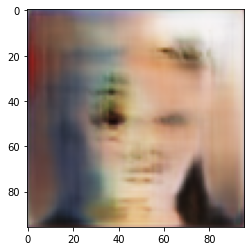

2000
tf.Tensor(1965.0652, shape=(), dtype=float32) tf.Tensor(-3427.4355, shape=(), dtype=float32)


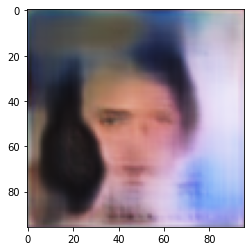

2200
tf.Tensor(1939.1373, shape=(), dtype=float32) tf.Tensor(-3412.7957, shape=(), dtype=float32)


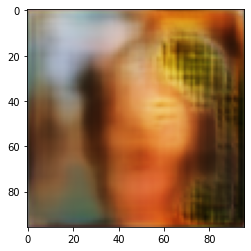

2400
tf.Tensor(2125.5964, shape=(), dtype=float32) tf.Tensor(-3642.4734, shape=(), dtype=float32)


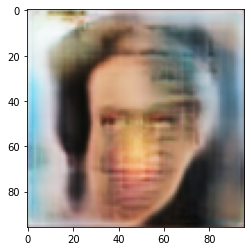

2600
tf.Tensor(2351.1904, shape=(), dtype=float32) tf.Tensor(-3769.703, shape=(), dtype=float32)


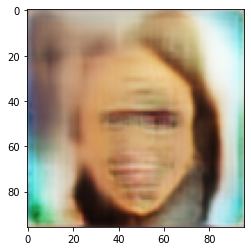

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 9, gen loss=2478.571533203125,disc loss=-3859.646484375,
Accuracy:  0.49870018756786993
Accuracy on fake:  0.0
200
tf.Tensor(4310.4907, shape=(), dtype=float32) tf.Tensor(-7491.4585, shape=(), dtype=float32)


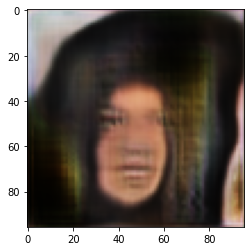

400
tf.Tensor(3367.0916, shape=(), dtype=float32) tf.Tensor(-6002.893, shape=(), dtype=float32)


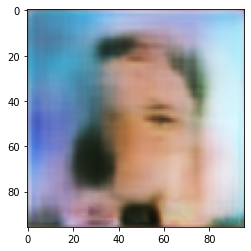

600
tf.Tensor(3586.7634, shape=(), dtype=float32) tf.Tensor(-5497.53, shape=(), dtype=float32)


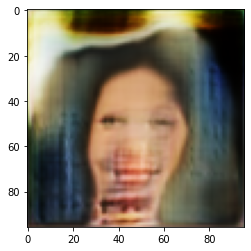

800
tf.Tensor(3936.4856, shape=(), dtype=float32) tf.Tensor(-6017.52, shape=(), dtype=float32)


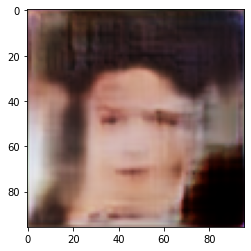

1000
tf.Tensor(4045.1765, shape=(), dtype=float32) tf.Tensor(-5747.6953, shape=(), dtype=float32)


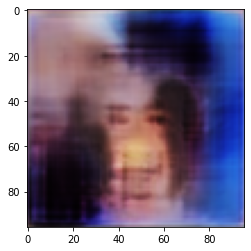

1200
tf.Tensor(4075.535, shape=(), dtype=float32) tf.Tensor(-5879.1455, shape=(), dtype=float32)


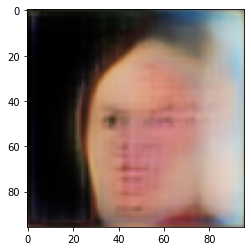

1400
tf.Tensor(3982.5735, shape=(), dtype=float32) tf.Tensor(-5658.85, shape=(), dtype=float32)


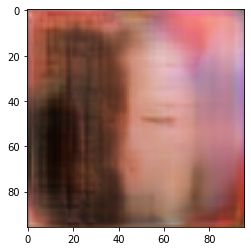

1600
tf.Tensor(3934.8425, shape=(), dtype=float32) tf.Tensor(-5720.315, shape=(), dtype=float32)


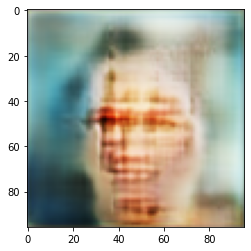

1800
tf.Tensor(3880.2212, shape=(), dtype=float32) tf.Tensor(-5426.547, shape=(), dtype=float32)


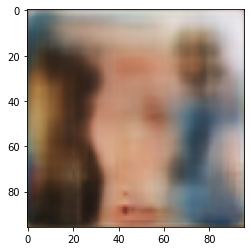

2000
tf.Tensor(3892.585, shape=(), dtype=float32) tf.Tensor(-5422.6836, shape=(), dtype=float32)


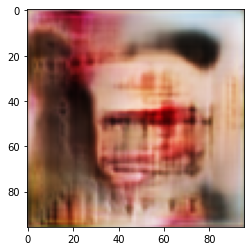

2200
tf.Tensor(4001.2747, shape=(), dtype=float32) tf.Tensor(-5483.358, shape=(), dtype=float32)


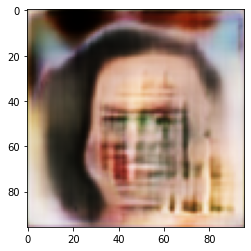

2400
tf.Tensor(4014.7412, shape=(), dtype=float32) tf.Tensor(-5488.0195, shape=(), dtype=float32)


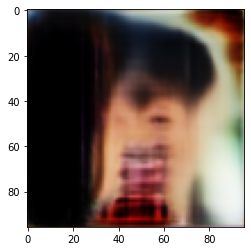

2600
tf.Tensor(4091.7092, shape=(), dtype=float32) tf.Tensor(-5449.0156, shape=(), dtype=float32)


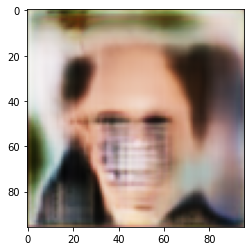

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN/assets
Epoch 10, gen loss=4099.3134765625,disc loss=-5432.02001953125,
Accuracy:  0.4964460824640495
Accuracy on fake:  9.871993155418079e-05


KeyboardInterrupt: ignored

In [ ]:
fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
epochs = 50

for epoch in range(epochs):

  gen_loss_list = []
  disc_loss_list = []

  batchNum = 0
  for image_batch in trainData:
    for i in range(4):
      t = train_step_disc(image_batch)
      disc_loss_list.append(t)
    t = train_step(image_batch)
    gen_loss_list.append(t[0]) 
    disc_loss_list.append(t[1])
    batchNum = batchNum + 1
    if batchNum % 200 == 0:
      print(batchNum)
      print(sum(gen_loss_list) / len(gen_loss_list), sum(disc_loss_list) / len(disc_loss_list))
      noise = tf.random.normal([1, SEED_SIZE])
      generated_image = generator(noise, training=False)
      plt.imshow(generated_image[0])
      #plt.savefig("generatedImage"+str(epoch)+"-"+str(batchNum))
      plt.show()
  
  generator.save("/content/gdrive/MyDrive/generator-VWGAN")
  discriminator.save("/content/gdrive/MyDrive/discriminator-VWGAN")
  
  correct = 0
  correct_fake = 0
  totalSize = val_size*2
  for image_batch in valData:
    realVal, fakeVal = val_step(image_batch)
    realVal = realVal.numpy() > 0
    fakeVal = fakeVal.numpy() < 0
    correct = correct + np.count_nonzero(realVal) + np.count_nonzero(fakeVal)
    correct_fake = correct_fake + np.count_nonzero(fakeVal)

  g_loss = sum(gen_loss_list) / len(gen_loss_list)
  d_loss = sum(disc_loss_list) / len(disc_loss_list)

  print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss},')
  print ("Accuracy: ", 1.0*correct/totalSize)
  print ("Accuracy on fake: ", 1.0*correct_fake/val_size)